# Tutorial AI4Mechanism
## Introduction of ATHENA
ATHENA is a computational framwork to analyse spatial heterogeneity in spatial single-cell omics data.

## Recap
### Bulk vs Single-cell technologies
The expression level of different molecular entities like mRNA, proteins or metabolites can be measured. Bulk technologies mesure the expression levels across many cells in a suspension, thus the measured expression values are an average of all cells in the sample and we cannot distinguis between different cell types.

Single-cell omics technologies measure expression levels on a single cell level. Each cell in the suspension is isolated and analysed. Mesurements are in general noisier but enable the distinction of different cell types. However, by supsending the cells we lose information about the connectivity of the single cells.
![Single-cell RNA-seq reveals cellular heterogeneity that is masked by bulk RNA-seq methods.
](img/single-cell-analysis.png)
Credits: 10xGenomics


### Spatial single-cell technologies
Spatial single-cell technologies allow an _in situ_ measurement of single cells. Prominent examples are Imaging Mass Cytometry (IMC), Multiplex Ion Beam Imaging (MIBI) or Visium.

**IMC Method**

A sample is "stained" with an antibody panel that is loaded with metal isotopes. A laser ablates subcellular spots of the tissue and the material is subjected to a time-of-flight mass spectrometer (TOF). In the mass spectrometer the abundance of the metal isotopes is recorded and directly translates into the abundance of the targeted molecular entity.   

![imc2.png](img/imc2.png)

### Comparison
Bluk $\rightarrow$ single-cell $\rightarrow$ spatial single cell increase the information content recovered from tissue samples. However, sample handling, data acquisition and data analysis becomes more complex.
![measurement.jpg](img/measurement.jpg)
Credits: 10xGenomics


## Overview ATHENA
1. Spatially resolved omics measurements are acquired, resulting in highly dimensional images.

2. If necessary (for IMC, MIBI) images are segmented into single cells (cellmasks) and single cell expression values are extracted. Based on the single cell expression values, cells are classified into different type, aka phenotyping.

3. Cellmasks are used to construct a graph representation of the data. The framework currently supports three flavours (radius, knn, contact) that we will showcase later in this tutorial

4. The framework provides a variety of methods to quantify the observed diversity in samples. Furthermore, methods to analyse the interaction strength of different phenotypes are provided. 

5. The quantification methods can be used to featurise samples, this featurization can be used in downstream ML models to stratify patients and to discover new biomarkers.


![overview.png](img/overview.png)

## Environment set up

In [1]:
import re
import pickle as pk
import os
import pandas as pd
import numpy as np
from tqdm import tqdm

## Load pre-computed data

In [2]:
root = '/Users/art/Box/internship_adriano/AI4Mechanisms/ATHENA-tutorial'

with open(os.path.join(root, 'data.pkl'), 'rb') as f:
    data = pk.load(f)

## Populate SpatialOmics instance

In [3]:
from spatialOmics import SpatialOmics

# create empyt instance
so = SpatialOmics()

Spatial omics technologies are an emergent field and currently no standard libraries or data structures exists for handling the generated data in a consistent way. To facilitate the development of this framework we introduce the _SpatialOmics_ class. Since we work with high-dimensional images, memory complexity is a problem. _SpatialOmics_ stores data in a HDF5 file and lazily loads the required images on the fly to keep the memory consumption low.
The design of this class is inspred by _AnnData_, a class developed for the analysis of single-cell data sets.

**Objective**
- Data standard for consistent method development
- Technology-agnostic (resolutions, multiplexing and modalities )


**Attributes**

- **X**: Single-cell expression values (observations)
- **var**: Annotation of features in X

- **obs**: Annotation of observations

- **spl**: Annotation of samples

- **G**: Graph representation of observations

- **images**: Raw images

- **masks**: Segmentation masks

- **uns**: Unstructured data


![spatialOmics.png](spatialOmics.png)


**Data hierarchy**

- Sample-level information: patient features, acquisition details
- Observation-level information: expression levels, coordinates, phenotyping
![sample.png](sample.png)

In [4]:
# load meta data
spl = pd.read_csv(os.path.join(root, 'meta_data.csv')).set_index('core')

# add sample level meta data
so.spl = spl

# samples we will work with
samples = ['slide_7_Cy2x2',
           'slide_7_Cy2x3',
           'slide_7_Cy2x4',
           'slide_59_Cy7x7',
           'slide_59_Cy7x8',
           'slide_59_Cy8x1',
           'SP43_116_X3Y4',
           'slide_49_By2x5']

# add image / mask data to instance
for s in samples:
    so.add_image(s, so.spl.file_fullstack.loc[s])
    so.add_mask(s, 'cellmasks', so.spl.file_cellmask.loc[s])
    so.add_mask(s, 'tumor_stroma', so.spl.file_tumor_stroma_mask.loc[s])

# populate instance with single cell expression values
so.X = data['X'].copy()
so.var = data['var'].copy()
so.obs = data['obs'].copy()

In [5]:
# single cell expression values (observations)
spl = so.spl.index[0]
so.X[spl]

channel,EGFR,E_P_Cadherin,DNA2,ERa,GATA3,H3,Ki_67,SMA,Vimentin,PARP,...,CD45,CD68,CD3epsilon,CarbonicAnhydraseIX,Cytokeratin8_18,Cytokeratin7,Twist,p_H3,p_S6,p_mTOR
cell_id,,,,,,,,,,,,,,,,,,,,,
1,0.165344,1.183775,3.202682,0.081938,0.386239,4.875233,0.385346,0.309082,1.645999,0.107978,...,0.106121,0.421638,0.000000,0.116085,0.027983,0.000000,0.112910,0.000000,0.281112,0.174515
2,0.129432,1.389950,2.159000,0.077545,0.297991,2.742464,0.030761,0.058203,0.000000,0.202478,...,0.000000,0.023954,0.025568,0.143582,0.074627,0.071728,0.029781,0.076168,0.033897,0.338990
3,0.243878,1.398108,2.052289,0.044888,0.332074,2.586745,0.182544,0.055361,0.000000,0.067192,...,0.126670,0.000000,0.000000,0.355725,0.273207,0.085036,0.047690,0.008177,0.026555,0.284243
4,0.076430,1.159536,3.736964,0.051870,0.197548,1.491320,0.096983,0.033590,0.071032,0.325389,...,0.150245,0.086211,0.012911,0.188923,0.244811,0.205994,0.000000,0.137765,0.090657,0.183750
5,0.188518,0.780047,2.432551,0.053380,0.384324,1.948492,0.066400,0.026064,0.066534,0.264665,...,0.046832,0.052987,0.000000,0.087992,0.213292,0.156372,0.032114,0.039372,0.055044,0.187811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3679,0.393030,2.825773,2.502553,0.098778,0.795798,7.297218,0.099616,0.564786,0.837189,0.334221,...,0.042870,0.202568,0.052866,0.486692,0.196825,0.028813,0.203014,0.087745,0.151612,0.213216
3680,0.175161,3.089091,5.502600,0.053485,1.013591,8.661993,0.000000,0.609968,0.849895,0.411247,...,0.109096,1.441359,0.000000,0.547073,0.038154,0.000000,0.239379,0.333810,0.157288,0.516685
3681,0.295956,4.528331,2.917840,0.105297,1.301961,4.851240,0.148745,0.120283,0.079923,0.472505,...,0.073269,0.471269,0.062333,0.828081,1.298515,0.218791,0.105862,0.080663,0.120460,0.593709


In [6]:
# annotation of observations
spl = so.spl.index[0]
so.obs[spl]

,meta_id,meta_label,cell_type_id,cell_type
cell_id,,,,
1,2,B and T cells,1,immune
2,10,Small elongated,3,stromal
3,21,Epithelial low,4,tumor
4,10,Small elongated,3,stromal
5,10,Small elongated,3,stromal
...,...,...,...,...
3679,10,Small elongated,3,stromal
3680,10,Small elongated,3,stromal
3681,20,CK7 CK,4,tumor


![metalabels.png](metalabels.png)

In [7]:
# feature annotation
spl = so.spl.index[0]
so.var[spl]

,target,feature_type,metal_tag,fullstack_index,channel,full_target_name
0,H3,expr,In113,8,1261726In113Di Histone,Histone H3
1,H3K28me3,expr,La139,11,473968La139Di Histone,Histone H3 (Lys28) trimethylate
2,Cytokeratin5,expr,Pr141,12,651779Pr141Di Cytoker,Cytokeratin 5
3,Fibronectin,expr,Nd142,13,3281668Nd142Di Fibrone,Fibronectin
4,Cytokeratin18,expr,Nd143,14,3111576Nd143Di Cytoker,Cytokeratin 19
5,Cytokeratin8_18,expr,Nd144,15,971099Nd144Di Cytoker,Cytokeratin 8/18
6,Twist,expr,Nd145,16,Nd145Di Twist,Twist
7,CD68,expr,Nd146,17,77877Nd146Di CD68,CD68
8,KRT14,expr,Sm147,18,346876Sm147Di Keratin,Keratin 14 (KRT14)
9,SMA,expr,Nd148,19,174864Nd148Di SMA,SMA


## Visualise raw images
To visualise the high-dimensional raw images we use the python image viewer napari.

In [8]:
import spatialHeterogeneity as sh

# sh.pl for plotting
# sh.graph for graph construction
# sh.pp for pre-processing
# sh.metrics for quantification
# sh.neigh for neighborhood quantification

spl = 'SP43_116_X3Y4'
proteins = ['DNA2', 'CarbonicAnhydraseIX', 'EGFR', 'CD45', 'Fibronectin', 'p53']
sh.pl.napari_viewer(so, spl, attrs=proteins, add_masks=so.masks[spl].keys())

/Users/art/opt/miniconda3/envs/spatial-heterogeneity/lib/python3.8/site-packages/napari/_vispy/vispy_camera.py:109: RuntimeWarning: divide by zero encountered in true_divide
  zoom = np.min(canvas_size / scale)


In [62]:
# extract centroids
for spl in tqdm(samples):
    sh.pp.extract_centroids(so, spl)

so.obs[spl]

100%|█████████████████████████████████████████████████████████████████████████████████████████| 11/11 [00:04<00:00,  2.44it/s]


,meta_id,meta_label,cell_type_id,cell_type,y,x
cell_id,,,,,,
1,19,CK7 CK hi Cadherin,4,tumor,2.525424,210.305085
2,17,p53 EGFR,4,tumor,1.363636,278.727273
3,14,Hypoxic,4,tumor,2.522388,290.477612
4,19,CK7 CK hi Cadherin,4,tumor,1.827586,372.206897
5,14,Hypoxic,4,tumor,2.428571,498.404762
...,...,...,...,...,...,...
1387,19,CK7 CK hi Cadherin,4,tumor,472.735849,386.679245
1388,19,CK7 CK hi Cadherin,4,tumor,472.602740,429.356164
1389,19,CK7 CK hi Cadherin,4,tumor,473.656250,439.812500


## Graph construction
The framework supports three differnt graph builders

**kNN**: Conncets each observation with its _k_ closest neighbors

**radius**: Connects a observation to all other observations within a radius _r_

**contact**: Connects observations that "touch" each other. In a frist step a mask is enlarged by dilation. All other masks that now overlap with this enlarged version are connected.

![dilation.png](dilation.png)

In [10]:
from spatialHeterogeneity.graph_builder.constants import GRAPH_BUILDER_DEFAULT_PARAMS

spl = 'slide_7_Cy2x3'

# KNN graph
config = GRAPH_BUILDER_DEFAULT_PARAMS['knn']
config['builder_params']['n_neighbors'] = 6
sh.graph.build_graph(so, spl, builder_type='knn', mask_key='cellmasks', config=config)

# radius graph
config = GRAPH_BUILDER_DEFAULT_PARAMS['radius']
config['builder_params']['radius'] = 36
sh.graph.build_graph(so, spl, builder_type='radius', mask_key='cellmasks', config=config)

# contact graph
sh.graph.build_graph(so, spl, builder_type='contact', mask_key='cellmasks')

100%|█████████████████████████████████████████████████████████████████████████████████████| 1369/1369 [00:36<00:00, 37.10it/s]


### Visualise Graphs

In [11]:
from matplotlib import cm
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import numpy as np

# set up colormaps
cmap_paper = np.array([[255, 255, 255], [10, 141, 66], [62, 181, 86], [203, 224, 87],  # 0 1 2 3
                       [84, 108, 47], [180, 212, 50], [23, 101, 54],  # 4 5 6
                       [248, 232, 13], [1, 247, 252], [190, 252, 252],  # 7 8 9
                       [150, 210, 225], [151, 254, 255], [0, 255, 250],  # 10 11 12
                       [154, 244, 253], [19, 76, 144], [0, 2, 251],  # 13 14 15
                       [147, 213, 198], [67, 140, 114], [238, 70, 71],  # 16 17 18
                       [80, 45, 143], [135, 76, 158], [250, 179, 195],  # 19 20 21
                       [246, 108, 179], [207, 103, 43], [224, 162, 2],  # 22 23 24
                       [246, 131, 110], [135, 92, 43], [178, 33, 28]])

cmap_labels = {22: 'CK low HR low',
               4: 'Macrophages',
               10: 'Small elongated',
               3: 'T cell',
               2: 'B and T cells',
               9: 'Small circular',
               25: 'HR low CK',
               5: 'T cell',
               16: 'Proliferative',
               7: 'Endothelial',
               21: 'Epithelial low',
               24: 'CK HR',
               8: 'Vimentin Hi',
               14: 'Hypoxic',
               11: 'Fibronectin Hi',
               23: 'HR hi CK',
               1: 'B cells',
               20: 'CK7 CK',
               13: 'SMA Hi Vimentin',
               15: 'Apopotic',
               18: 'Basal CK',
               19: 'CK7 CK hi Cadherin',
               17: 'p53 EGFR',
               12: 'Larger elongated',
               27: 'Myoepithalial',
               26: 'CK low HR hi p53',
               6: 'Macrophages',
               0: 'Background'}

uns = {'cmaps': {}, 'cmap_labels': {}}
uns['cmaps'].update({'default': cm.Reds})
uns['cmaps'].update({'category': cm.Set3})

uns['cmaps'].update({'meta_id': ListedColormap(cmap_paper / 255)})
uns['cmap_labels'].update({'meta_id': cmap_labels})

# the uns attribute can be used to store pre-defined colormaps for plotting
so.uns.update(uns)

/var/folders/_k/jn6dxr9162d0528_8cys3kh00000kp/T/ipykernel_99495/3581877000.py:13: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


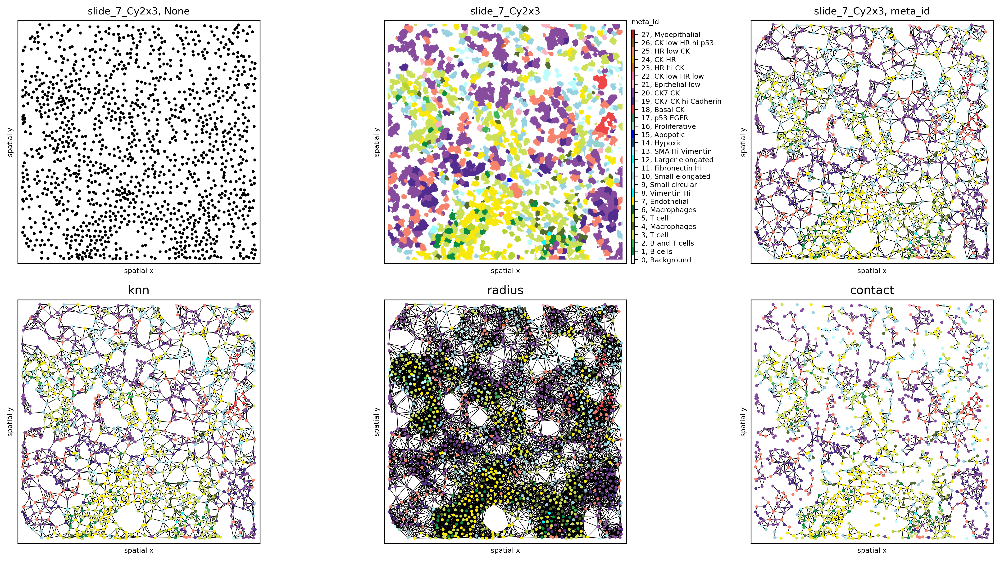

In [12]:
# plot graphs
fig, axs = plt.subplots(2, 3, figsize=(16, 8), dpi=300)
sh.pl.spatial(so, spl, None, ax=axs.flat[0])
sh.pl.spatial(so, spl, 'meta_id', mode='mask', ax=axs.flat[1])
sh.pl.spatial(so, spl, 'meta_id', edges=True, graph_key='knn', ax=axs.flat[2], cbar=False)
# fig.tight_layout()
# fig.show()

for ax, graph_key in zip(axs[1,], ['knn', 'radius', 'contact']):
    sh.pl.spatial(so, spl, 'meta_id', edges=True, graph_key=graph_key, ax=ax, cbar=False)
    ax.set_title(graph_key)
fig.tight_layout()
fig.show()

## Quantification of diversity

### Introduction
The quantification of the diversity in an ecosystem or a community is a long-standing problem in ecology and, not surprisingly, a vast body of scientific literature has addressed the problem. The application of the concepts developed in ecology to cancer research is straightforward and there is a direct analogy between species/cell types and ecological niches/tumor micro-environments. In general, the metrics developed in ecology try to describe the number of species and their relative abundance within a ecosystem, weighting both aspects differently depending on the metric. The mathematical foundation of these metrics is rooted in information theory.

![entropic-measures.png](entropic-measures.png)


### Spatial adaption
The harness the spatial information about the tumor architecture we adjusted the computation of the diversity indices to consider the phenotype distributions of the single observations (cells). Diversity measures can be computed on a _global_ scope (top) or on a _local_ scope (bottom). 
![local-global.png](local-global.png)


### Overview
The result column indicates if the metric is computed on a global (sample) level or on a local (cell or spot) level. The input col- umn specifies the input information used by the metrics. A metric that uses the phenotype distribution does not rely on spatial information. In contrast, metrics that require a graph input use the spatial information encoded in this data representation. Results of some methods depend on hyperparameter choices, as indi- cated by the last column. Every metric depends on the phenotyping process employed in the experimental setting.

![metrics-overview.png](metrics-overview.png)

In [13]:
# compute cell count
so.spl['cell_count'] = [len(so.obs[s]) for s in so.obs.keys()]
so.spl['immune_cell_count'] = [np.sum(so.obs[s].cell_type == 'immune') for s in so.obs.keys()]

# define sample for which we want to compute the metrics
spl = 'SP43_116_X3Y4'

# add pre-computed contact graphs
so.G[spl] = {}
so.G[spl].update(data['G'][spl])
sh.graph.build_graph(so, spl, builder_type='radius', mask_key='cellmasks')

sh.metrics.richness(so, spl, 'meta_id', local=False)
sh.metrics.richness(so, spl, 'meta_id', local=True, graph_key='contact')
sh.metrics.richness(so, spl, 'meta_id', local=True, graph_key='radius')
sh.metrics.shannon(so, spl, 'meta_id', local=True, graph_key='contact')
sh.metrics.shannon(so, spl, 'meta_id', local=True, graph_key='radius')

In [14]:
so.spl.loc[spl]

pid                                                                     116
grade                                                                     3
location                                                                NaN
tumor_size                                                             24.0
gender                                                               FEMALE
age                                                                      49
disease_status                                                        tumor
ER_status                                                          negative
PR_status                                                          negative
filename_fullstack        BaselTMA_SP43_29.3kx15.5ky_7000x8000_3_2017092...
height                                                                  792
width                                                                   802
area                                                                 635184
subtype     

In [15]:
so.obs[spl]

,meta_id,meta_label,cell_type_id,cell_type,y,x,richness_meta_id_contact,richness_meta_id_radius,shannon_meta_id_contact,shannon_meta_id_radius
cell_id,,,,,,,,,,
1,22,CK low HR low,4,tumor,0.823529,20.058824,1,6,-0.000000,2.413088
2,10,Small elongated,3,stromal,1.928571,68.666667,3,6,1.500000,1.819722
3,14,Hypoxic,4,tumor,2.316667,80.233333,4,6,1.664498,1.681899
4,14,Hypoxic,4,tumor,2.070175,119.438596,2,3,0.650022,0.513185
5,17,p53 EGFR,4,tumor,0.920000,193.280000,1,3,-0.000000,0.824980
...,...,...,...,...,...,...,...,...,...,...
6076,10,Small elongated,3,stromal,789.684211,573.052632,3,4,1.500000,1.241510
6077,10,Small elongated,3,stromal,789.305556,606.694444,2,2,0.721928,0.413817
6078,16,Proliferative,4,tumor,786.169231,691.700000,3,6,1.378783,2.150614


/var/folders/_k/jn6dxr9162d0528_8cys3kh00000kp/T/ipykernel_99495/489916326.py:11: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


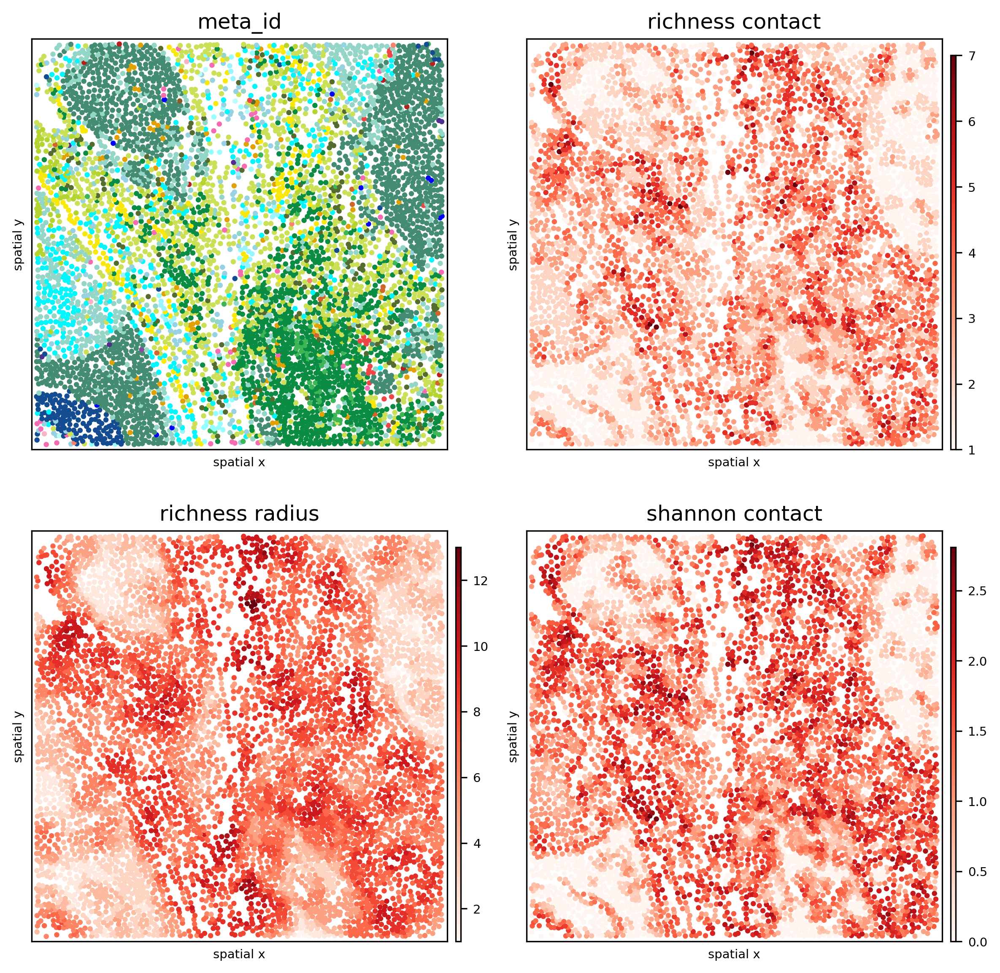

In [16]:
# %% visualise metrics
fig, axs = plt.subplots(2, 2, figsize=(8, 8), dpi=300)
axs = axs.flat

sh.pl.spatial(so, spl, 'meta_id', ax=axs[0], cbar=False)
sh.pl.spatial(so, spl, 'richness_meta_id_contact', ax=axs[1], cbar_title=False)
sh.pl.spatial(so, spl, 'richness_meta_id_radius', ax=axs[2], cbar_title=False)
sh.pl.spatial(so, spl, 'shannon_meta_id_contact', ax=axs[3], cbar_title=False)
for ax, title in zip(axs, ['meta_id', 'richness contact', 'richness radius', 'shannon contact']):
    ax.set_title(title)
fig.show()

/var/folders/_k/jn6dxr9162d0528_8cys3kh00000kp/T/ipykernel_99495/880969580.py:23: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


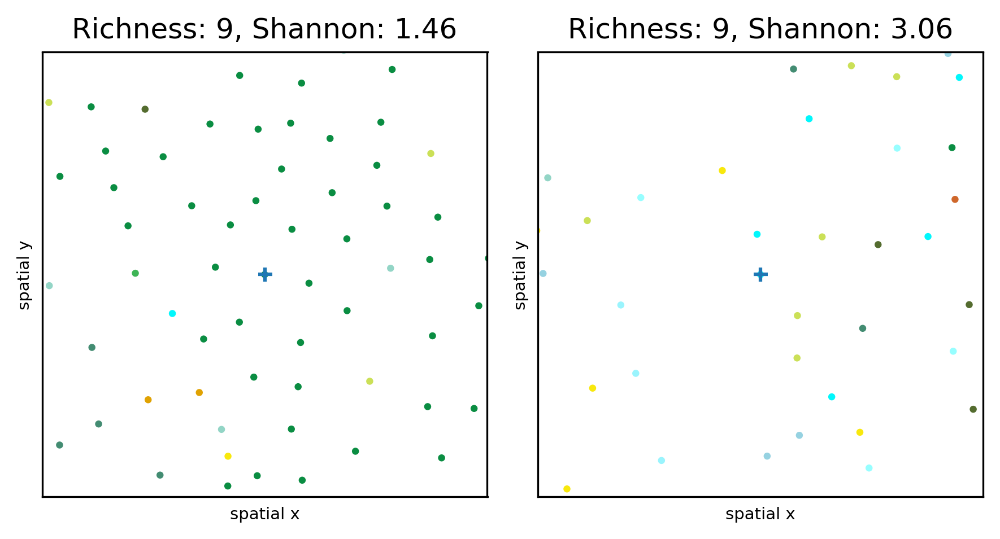

In [17]:
res = so.obs[spl].sort_values(['richness_meta_id_radius', 'shannon_meta_id_radius'], ascending=[False, True])
res = res[['richness_meta_id_radius', 'shannon_meta_id_radius']]
cell_id = [546, 5788]

fig, axs = plt.subplots(1, 2, dpi=300)
ax = axs[0]
sh.pl.spatial(so, spl, 'meta_id', ax=ax, cbar=False, graph_key='radius')
x = so.obs[spl].loc[cell_id[0]].x
y = so.obs[spl].loc[cell_id[0]].y
ax.scatter(x, y, marker='+', zorder=10)
ax.set_xlim([x - 36, x + 36])
ax.set_ylim([y - 36, y + 36])
ax.set_title(
    f'Richness: {so.obs[spl].loc[cell_id[0]].richness_meta_id_radius}, Shannon: {so.obs[spl].loc[cell_id[0]].shannon_meta_id_radius:.2f}')

ax = axs[1]
sh.pl.spatial(so, spl, 'meta_id', ax=ax, cbar=False, graph_key='radius')
x = so.obs[spl].loc[cell_id[1]].x
y = so.obs[spl].loc[cell_id[1]].y
ax.scatter(x, y, marker='+', zorder=10)
ax.set_xlim([x - 36, x + 36])
ax.set_ylim([y - 36, y + 36])
ax.set_title(
    f'Richness: {so.obs[spl].loc[cell_id[1]].richness_meta_id_radius}, Shannon: {so.obs[spl].loc[cell_id[1]].shannon_meta_id_radius:.2f}')
fig.show()

INFO:numexpr.utils:NumExpr defaulting to 4 threads.
/var/folders/_k/jn6dxr9162d0528_8cys3kh00000kp/T/ipykernel_99495/2045465325.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


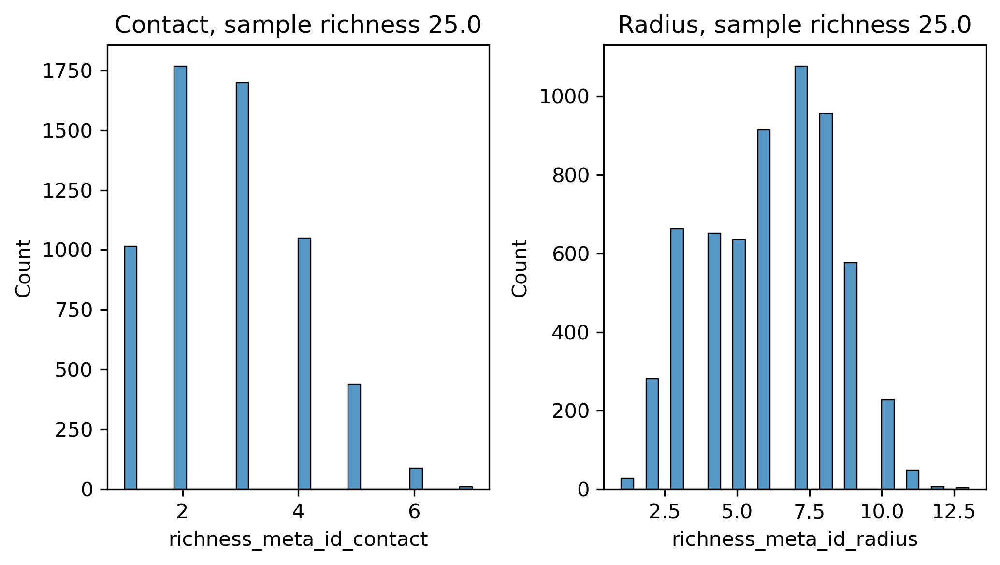

In [18]:
import seaborn as sns

fig, axs = plt.subplots(1, 2, figsize=(7, 4), dpi=300)
sns.histplot(data=so.obs[spl], x='richness_meta_id_contact', ax=axs[0])
axs[0].set_title(f'Contact, sample richness {so.spl.loc[spl].richness_meta_id}')
sns.histplot(data=so.obs[spl], x='richness_meta_id_radius', ax=axs[1])
axs[1].set_title(f'Radius, sample richness {so.spl.loc[spl].richness_meta_id}')
fig.tight_layout()
fig.show()

## Infiltration
The infiltration score was introduced by Keren _et al._ to measure the degree of immune cell infiltration into the tmour mass.
$$\text{score}=\frac{N_{it}}{N_{ii}}$$
where $N_{it}$ is the number of edges between tumor and immune cells and $N_{ii}$ the number of edges between immune cells.

In [19]:
# %% infiltration
high_var_samples = ['slide_7_Cy2x2', 'slide_7_Cy2x3', 'slide_7_Cy2x4']
low_var_samples = ['slide_59_Cy7x7', 'slide_59_Cy7x8', 'slide_59_Cy8x1']
spls = high_var_samples + low_var_samples

for s in tqdm(spls):
    # add pre-computed graphs
    if s not in so.G: so.G[s] = {}
    so.G[s].update(data['G'][s])
    sh.neigh.infiltration(so, s, 'cell_type', graph_key='contact')

so.spl.loc[spls].infiltration

100%|███████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:00<00:00, 10.82it/s]


core
slide_7_Cy2x2     0.068071
slide_7_Cy2x3     0.117735
slide_7_Cy2x4     0.553333
slide_7_Cy2x5     0.954545
slide_59_Cy7x7    0.143432
slide_59_Cy7x8    0.195754
slide_59_Cy8x1    0.193103
slide_59_Cy8x2    0.197795
Name: infiltration, dtype: float64

/var/folders/_k/jn6dxr9162d0528_8cys3kh00000kp/T/ipykernel_99495/3192481186.py:13: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


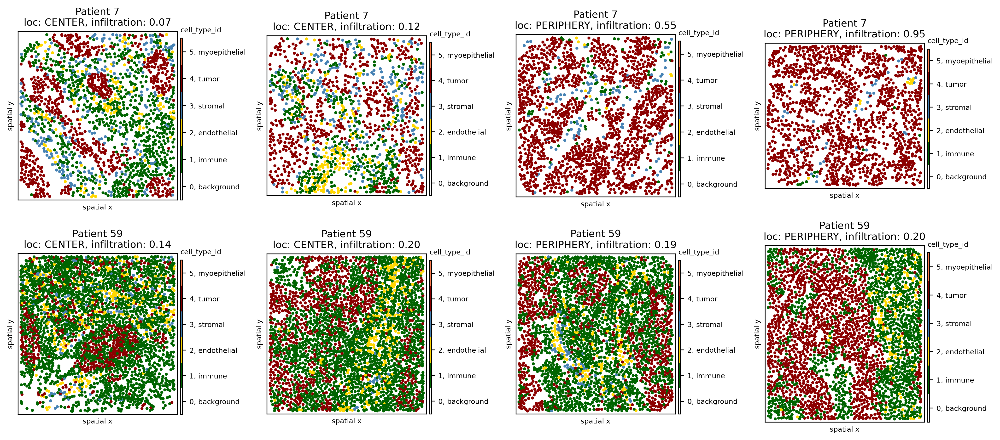

In [20]:
cmap = ['white', 'darkgreen', 'gold', 'steelblue', 'darkred', 'coral']
cmap_labels = {0: 'background', 4: 'tumor', 5: 'myoepithelial', 1: 'immune', 2: 'endothelial', 3: 'stromal'}
cmap = ListedColormap(cmap)

so.uns['cmaps'].update({'cell_type_id': cmap})
so.uns['cmap_labels'].update({'cell_type_id': cmap_labels})

fig, axs = plt.subplots(2, 4, figsize=(14, 7), dpi=300)
for ax, spl in zip(axs.flat, high_var_samples + low_var_samples):
    sh.pl.spatial(so, spl, 'cell_type_id', ax=ax)
    d = so.spl.loc[spl]
    ax.set_title(f'Patient {d.pid}\nloc: {d.location}, infiltration: {d.infiltration:.2f}', fontdict={'size': 10})
fig.show()

## Phenotype interactions

Interaction strength of pairs-wise phenotypes is computed by observing the number or proportion of interaction a given phenotype has with another phenotype on average across a sample. A permutation test is used to determine whether the observed interaction strength is an  enrichment or depletion.

![interactions.png](interactions.png)
<!-- ![interactions-quant.png](interactions-quant.png) -->

In [21]:
spl = 'slide_49_By2x5'
so.G[spl] = {}
so.G[spl].update(data['G'][spl])

sh.neigh.interactions(so, spl, 'meta_id', mode='proportion', prediction_type='diff', graph_key='contact')

INFO:root:loading h0 for slide_49_By2x5, graph type contact and mode proportion


/var/folders/_k/jn6dxr9162d0528_8cys3kh00000kp/T/ipykernel_99495/3185126077.py:10: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


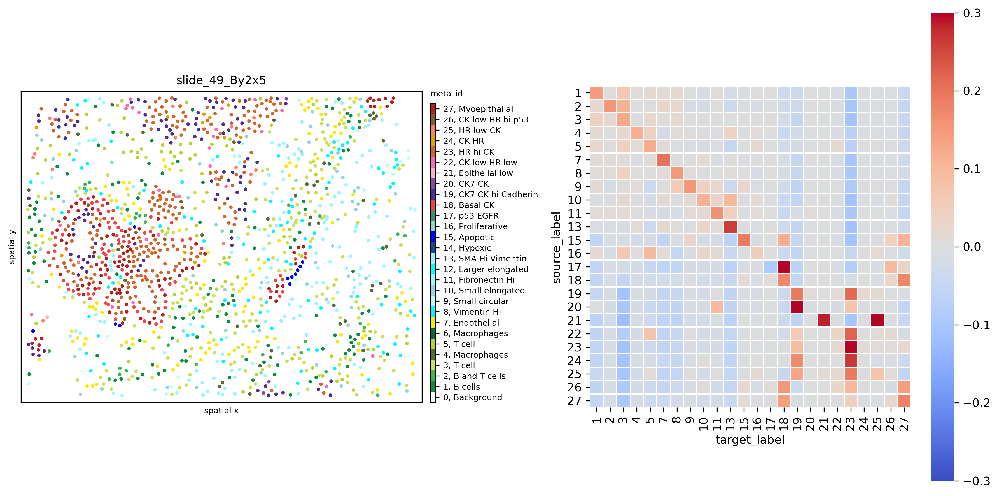

In [22]:
from matplotlib.colors import Normalize

fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=300)
norm = Normalize(-.3, .3)

sh.pl.spatial(so, spl, 'meta_id', ax=axs[0])
sh.pl.interactions(so, spl, 'meta_id', mode='proportion', prediction_type='diff', graph_key='contact', ax=axs[1],
                   norm=norm)

fig.tight_layout()
fig.show()

In [23]:
so.obs[spl].meta_id.value_counts(sort=False)

1     114
2      32
3     220
4      40
5      91
6       0
7     116
8      97
9      24
10     45
11     42
12      0
13    116
14      0
15     11
16     19
17      1
18     84
19    105
20      3
21      1
22     24
23    214
24     12
25     16
26     14
27    100
Name: meta_id, dtype: int64

INFO:root:loading h0 for slide_49_By2x5, graph type contact and mode proportion
/var/folders/_k/jn6dxr9162d0528_8cys3kh00000kp/T/ipykernel_99495/4198393301.py:8: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


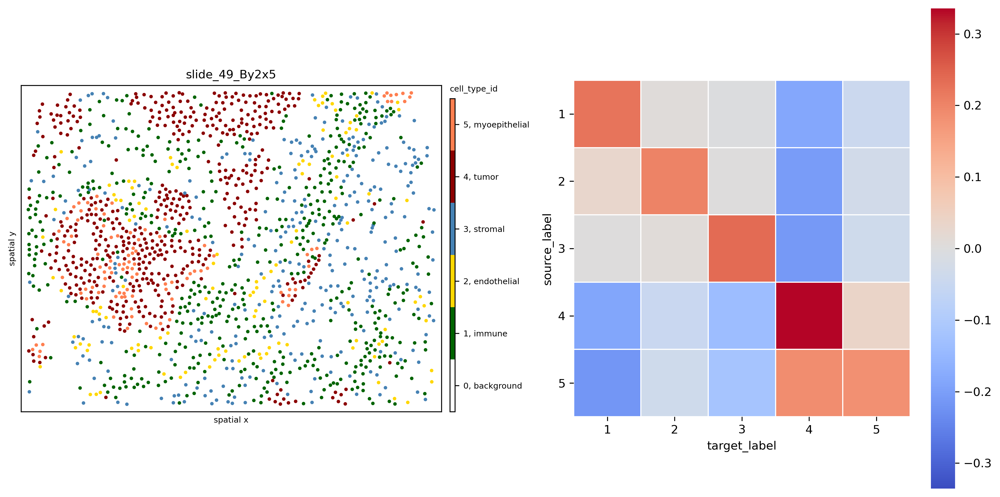

In [24]:
sh.neigh.interactions(so, spl, 'cell_type_id', mode='proportion', prediction_type='diff', graph_key='contact')

fig, axs = plt.subplots(1, 2, figsize=(12, 6), dpi=300)
sh.pl.spatial(so, spl, 'cell_type_id', ax=axs[0])
norm = Normalize(-.3, .3)
sh.pl.interactions(so, spl, 'cell_type_id', mode='proportion', prediction_type='diff', graph_key='contact', ax=axs[1])
fig.tight_layout()
fig.show()

## Simulation

**Objective**
- Generate artificial data capturing different spatial organisation regimes
- Evaluate how metrics capture changes in spatial organisation

**Requirements**
- Generate relevant patterns
- Specify the interaction between cell types
- Random process to capture variation

**Approach**
- Generate patterns with a Markov chain in space

![simulation.png](simulation.png)